<a href="https://colab.research.google.com/github/KhoiDOO/Practice/blob/main/Generative%20Deep%20Learning/Pytorch/1%20Simple_GAN_Pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

# Generator

In [2]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [3]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

# Noise

In [4]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    return torch.randn(n_samples,z_dim,device=device)

# Discriminator

In [5]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )

In [6]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

# Training

In [8]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

# Setup cuda
device = 'cuda'

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [9]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [10]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     Steps:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

In [11]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     Steps:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise) 
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3880863704681392, discriminator loss: 0.4192592334151274


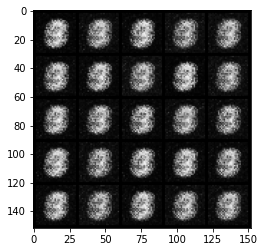

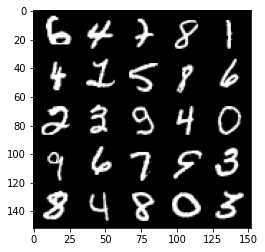

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.6689650263786295, discriminator loss: 0.30028116425871876


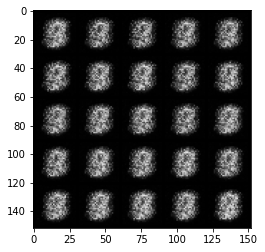

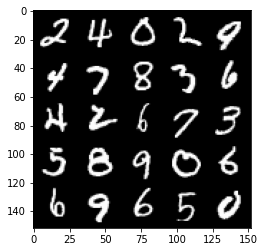

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.9593469610214238, discriminator loss: 0.17415257668495152


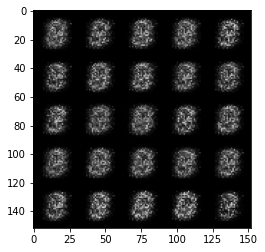

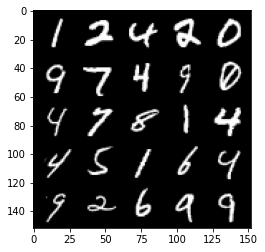

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.7621222927570344, discriminator loss: 0.1956253527104855


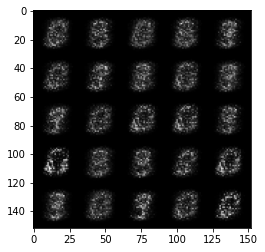

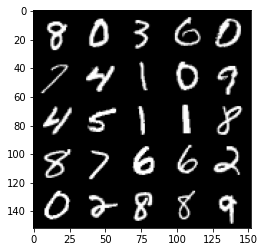

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.7262687559127803, discriminator loss: 0.1948897701203824


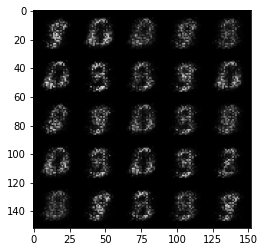

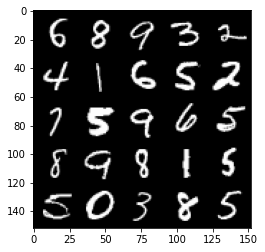

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.0249788150787356, discriminator loss: 0.1510555897951126


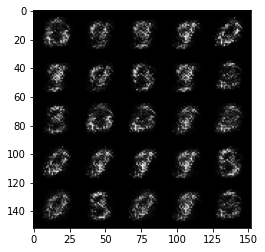

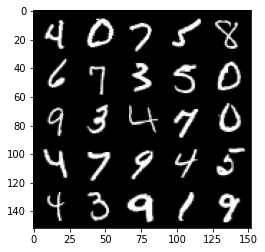

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.402163200855254, discriminator loss: 0.12600728003680695


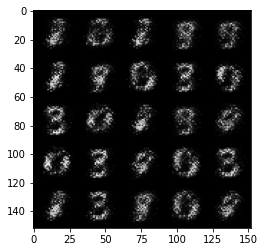

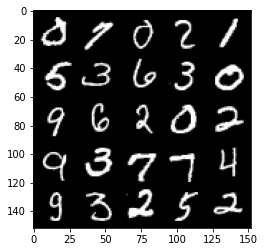

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.7092508234977712, discriminator loss: 0.1251295041739941


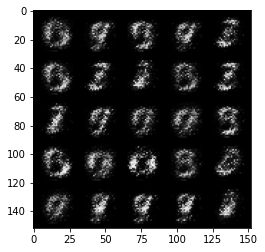

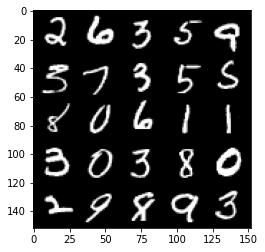

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.185977814674373, discriminator loss: 0.09972721417248243


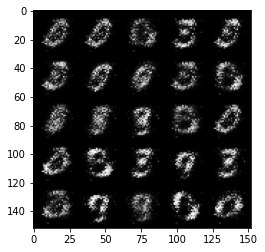

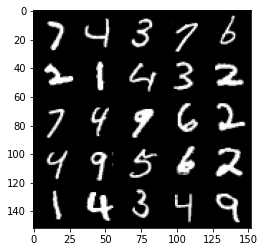

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.4596895565986623, discriminator loss: 0.08045303206145772


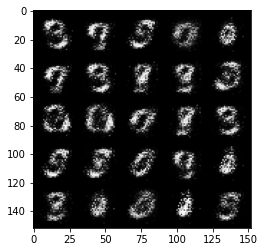

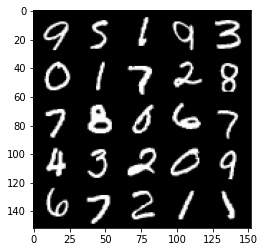

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.74385336732864, discriminator loss: 0.0799176804944873


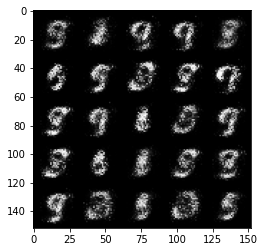

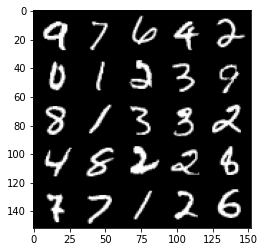

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.7594187216758765, discriminator loss: 0.07857221792638304


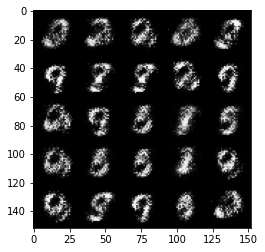

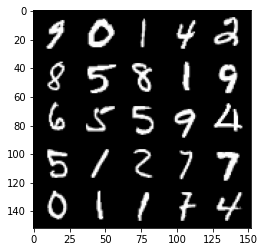

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.901934449672699, discriminator loss: 0.06379558699578043


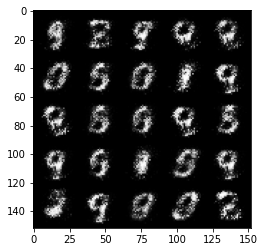

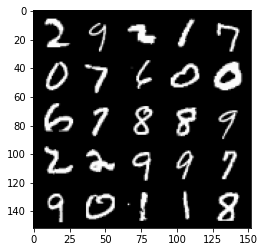

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 3.9911224088668815, discriminator loss: 0.05121823263540862


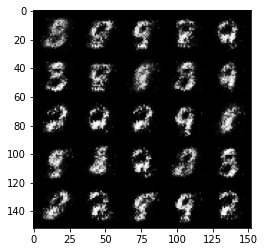

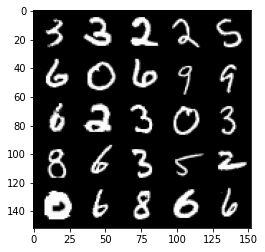

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.117860516071322, discriminator loss: 0.04745734241232279


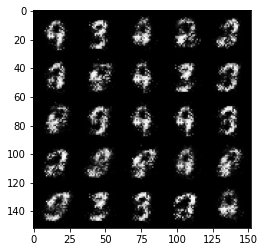

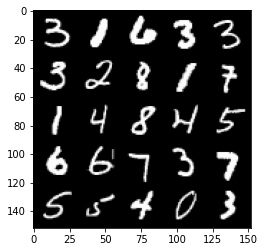

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.1102423205375676, discriminator loss: 0.051639268822968064


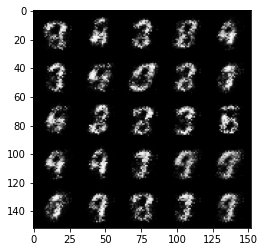

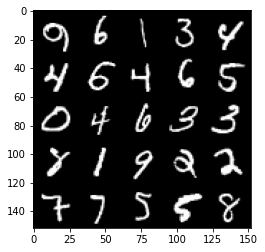

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.05608614492416, discriminator loss: 0.05761038658395411


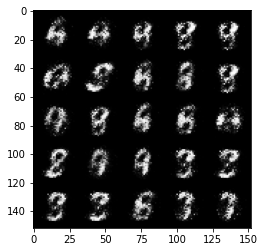

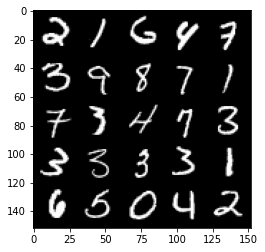

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.193668779373168, discriminator loss: 0.0652612106874586


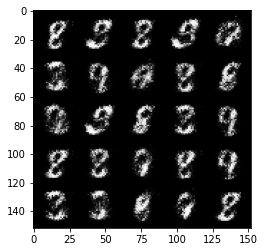

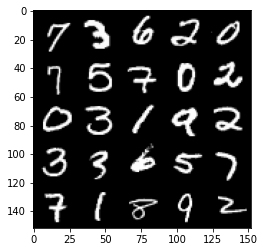

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.139429272651674, discriminator loss: 0.05934772003814574


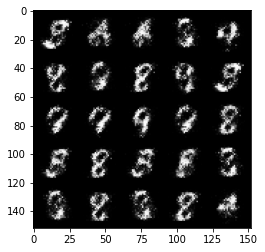

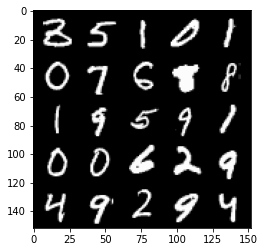

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.15946598625183, discriminator loss: 0.06688883487135174


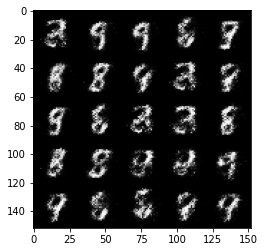

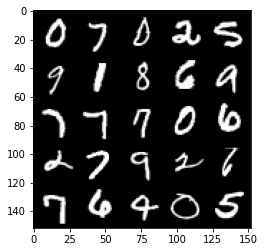

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 3.940160140514375, discriminator loss: 0.07603019231930372


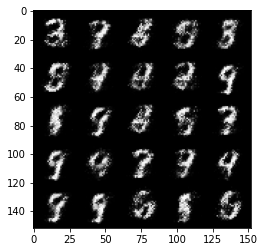

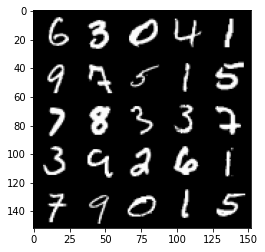

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 3.9819825882911646, discriminator loss: 0.07194628411531458


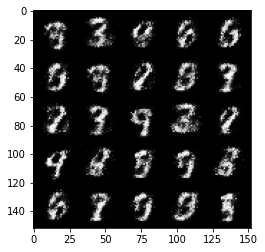

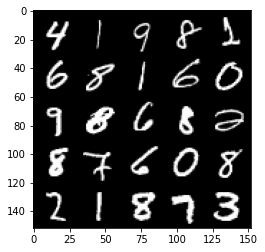

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.8641503186225896, discriminator loss: 0.07990778619050984


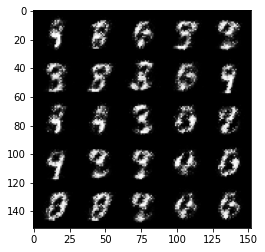

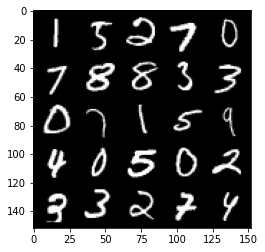

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.855944655418395, discriminator loss: 0.07921883541345602


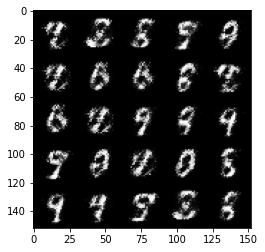

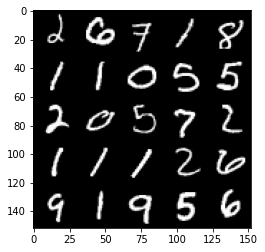

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.718758085250851, discriminator loss: 0.09874209172278632


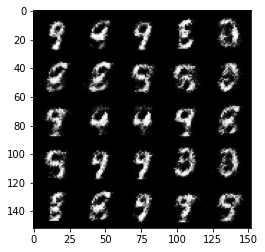

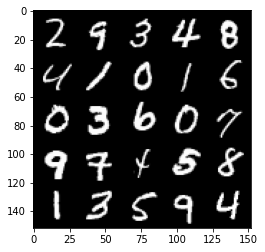

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.664926981925965, discriminator loss: 0.1054040553569793


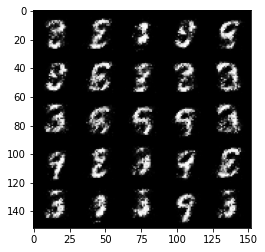

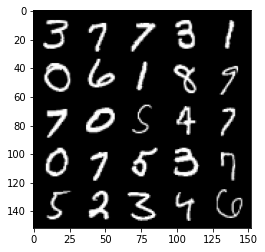

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.867738954067231, discriminator loss: 0.092208155810833


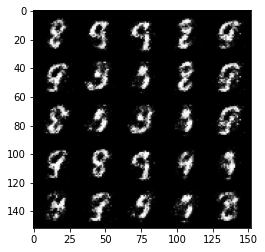

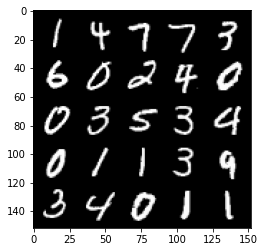

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.550451254367826, discriminator loss: 0.12125770934671162


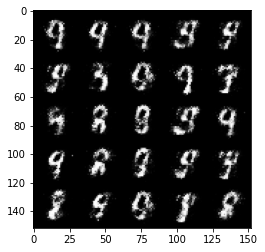

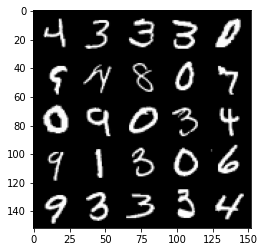

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.5775562829971355, discriminator loss: 0.10047641449421649


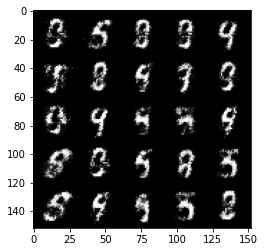

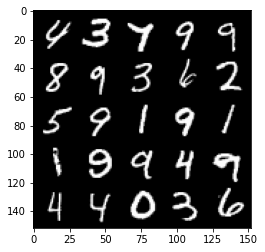

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.556899539947511, discriminator loss: 0.10101564843952647


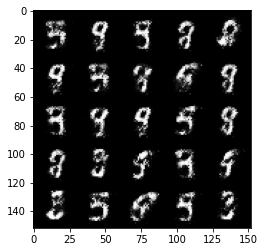

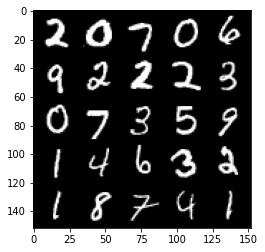

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.4735491290092493, discriminator loss: 0.12185490408539762


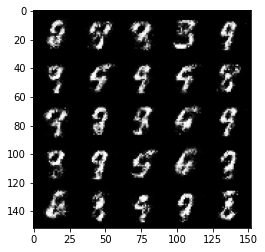

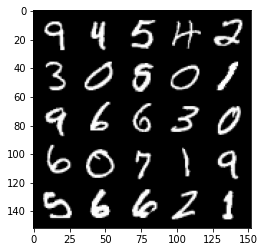

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.5717370891571045, discriminator loss: 0.11947327589243656


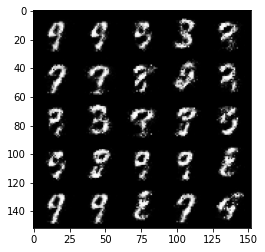

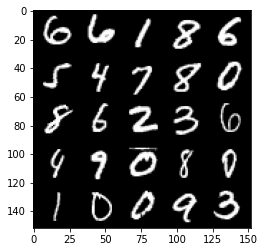

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.423689101219176, discriminator loss: 0.11842131967842577


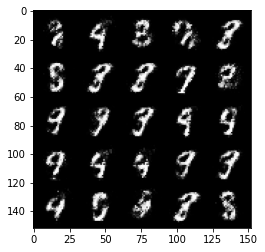

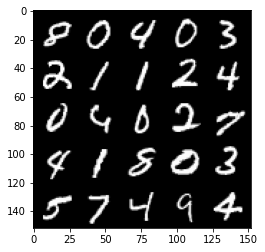

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.3951629247665442, discriminator loss: 0.11868664331734172


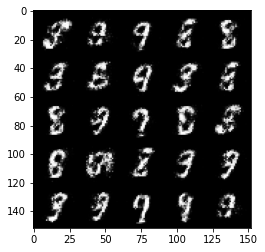

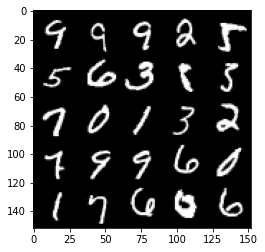

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.4871059908866853, discriminator loss: 0.13563105225563055


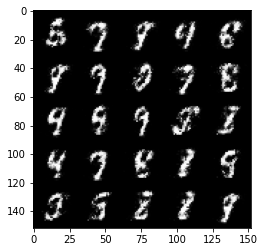

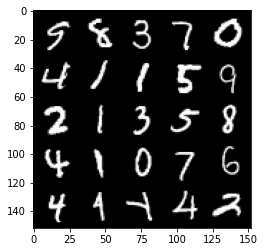

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.399783459186553, discriminator loss: 0.14474749490618713


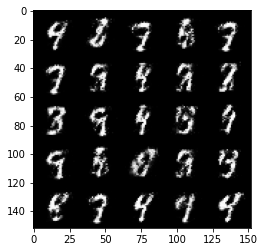

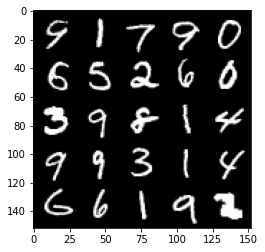

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.4866512422561633, discriminator loss: 0.12639812288433303


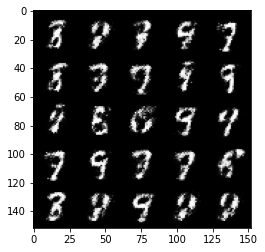

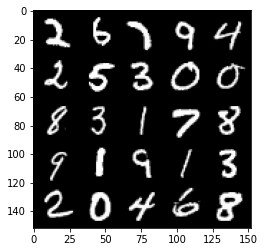

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.4074820652008047, discriminator loss: 0.1472231186926365


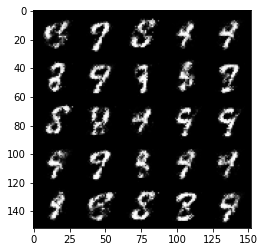

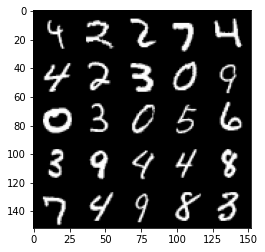

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.2703115072250375, discriminator loss: 0.14893605452775946


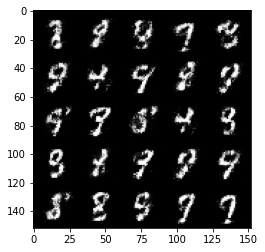

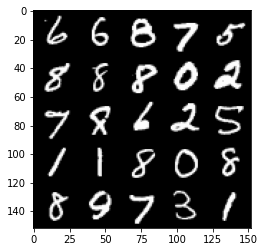

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.2817002902030974, discriminator loss: 0.15393714395165434


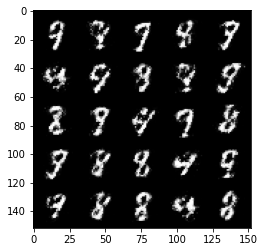

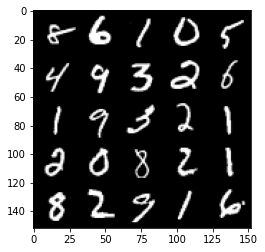

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.131271417617799, discriminator loss: 0.16974993179738512


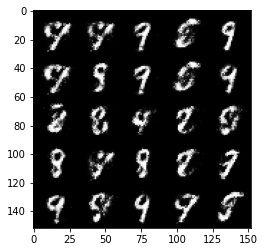

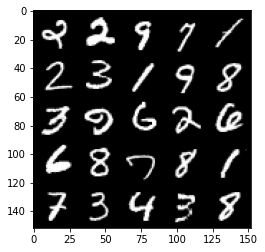

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.0877498974800135, discriminator loss: 0.1685849719643594


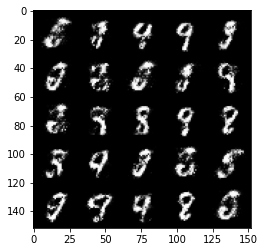

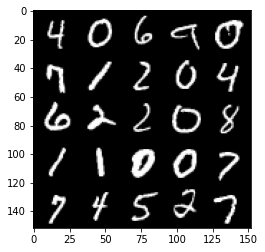

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.0430713291168177, discriminator loss: 0.16561772044003029


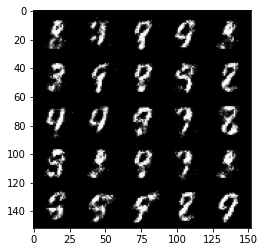

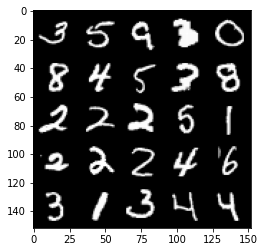

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.078830808639527, discriminator loss: 0.17246848557889488


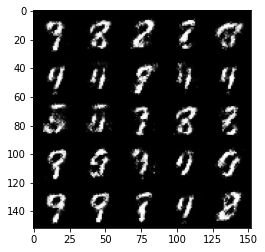

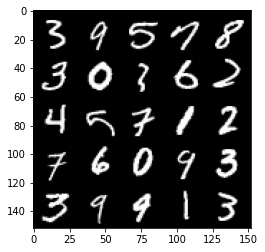

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.0849263567924474, discriminator loss: 0.18631929351389404


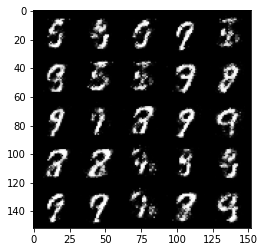

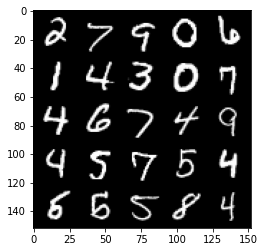

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 2.9504419531822217, discriminator loss: 0.18432107008993623


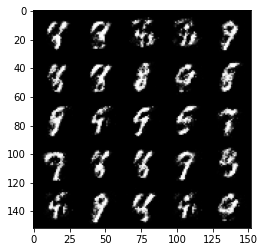

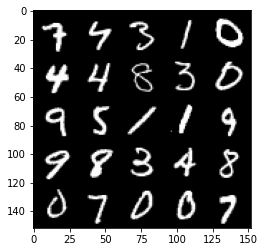

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 2.920652174472807, discriminator loss: 0.19396196615695965


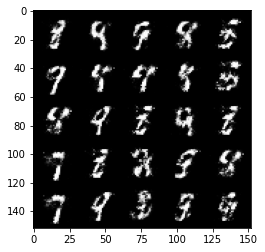

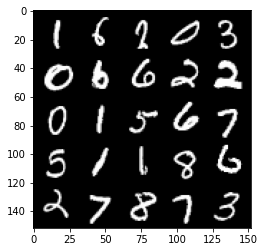

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.789566756248472, discriminator loss: 0.19900117476284515


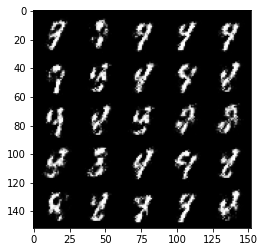

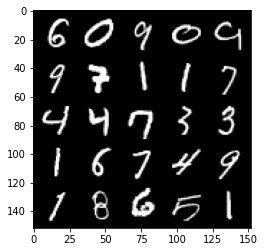

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.028129632949829, discriminator loss: 0.1770433125793933


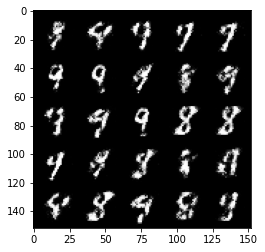

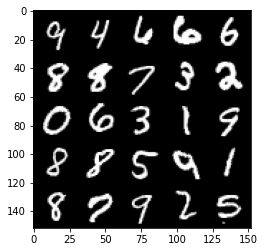

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.941133487224581, discriminator loss: 0.19959570732712745


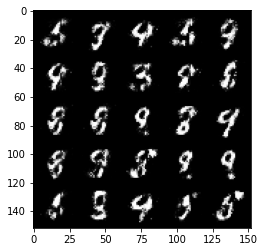

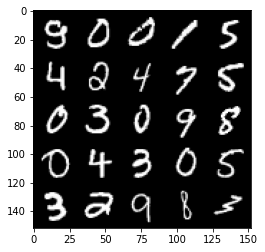

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 3.0147963881492577, discriminator loss: 0.1792628862857819


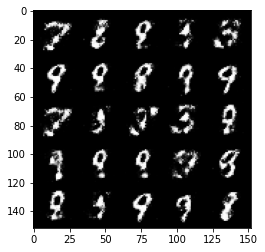

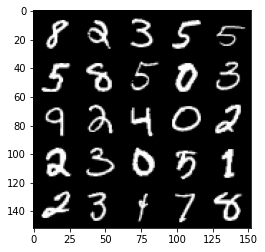

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.8603707246780408, discriminator loss: 0.2057095445394515


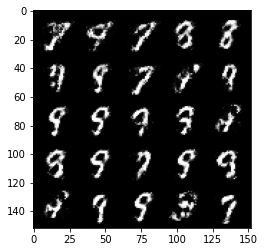

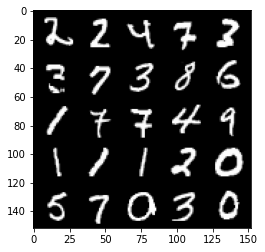

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.7909136152267435, discriminator loss: 0.21074129523336899


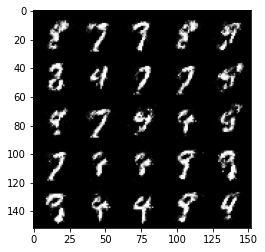

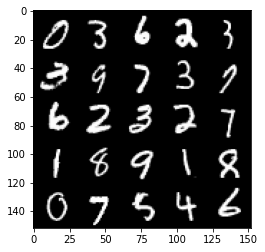

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.795691652774811, discriminator loss: 0.19086159746348857


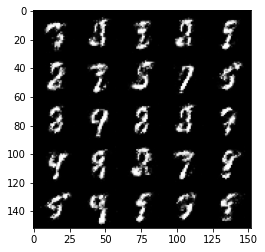

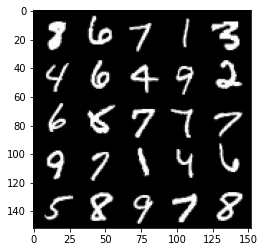

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.762166136741639, discriminator loss: 0.2249408553093671


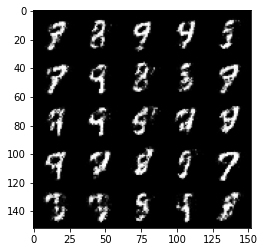

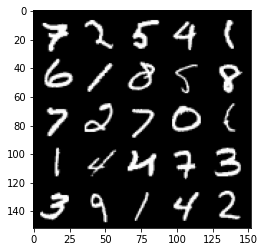

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.6780711193084734, discriminator loss: 0.23148494091629998


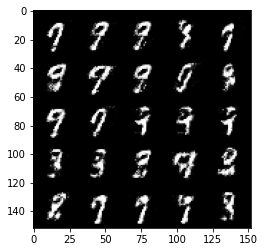

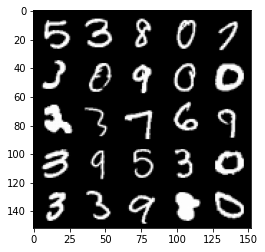

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.6798559656143204, discriminator loss: 0.22089815613627423


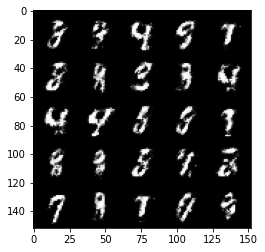

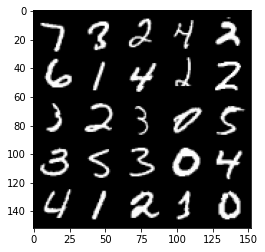

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.5905871934890716, discriminator loss: 0.22994736656546594


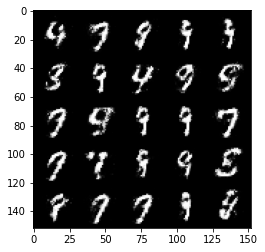

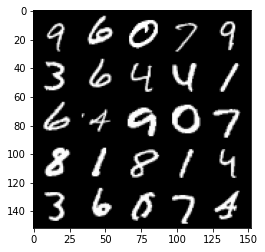

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.6583611111640955, discriminator loss: 0.2243967016339303


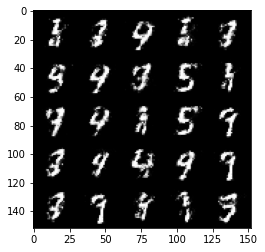

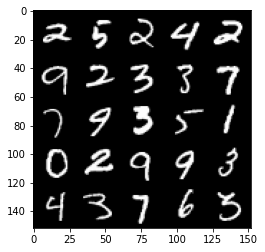

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.699586911678314, discriminator loss: 0.2057666448801755


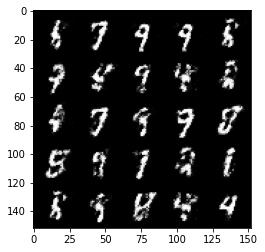

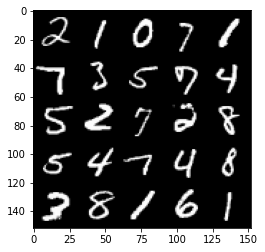

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.674440140247344, discriminator loss: 0.21226664888858787


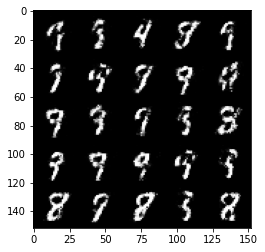

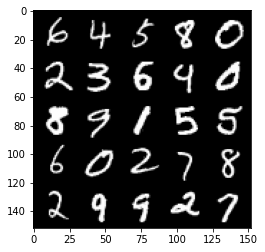

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.6001816761493672, discriminator loss: 0.2291961197853089


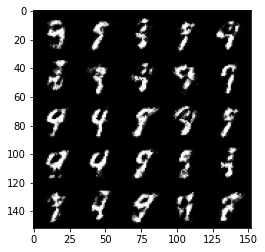

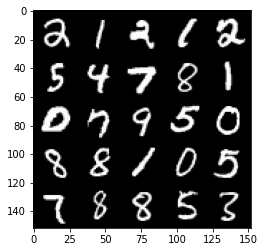

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.5749548859596247, discriminator loss: 0.24540902096033101


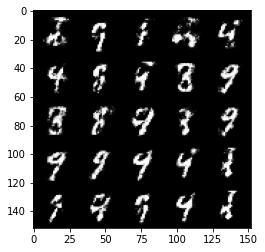

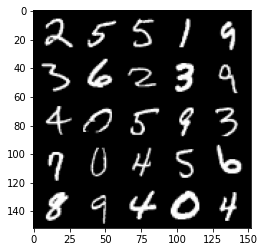

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.499874863624574, discriminator loss: 0.250916106969118


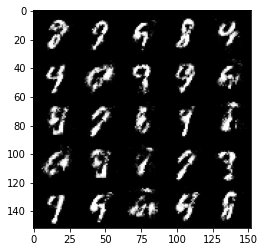

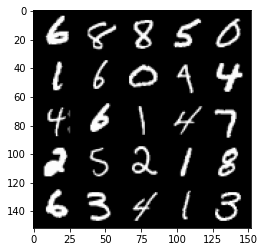

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.4765923852920526, discriminator loss: 0.24941842792928207


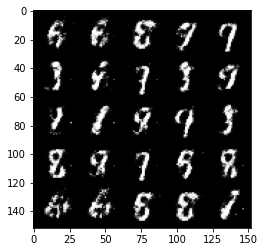

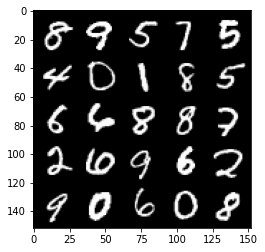

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.4636576561927797, discriminator loss: 0.25637177047133436


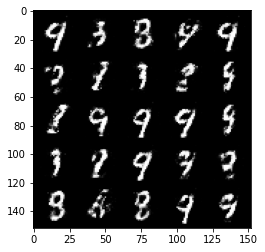

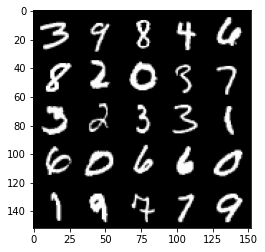

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.4602893695831303, discriminator loss: 0.2516120439171791


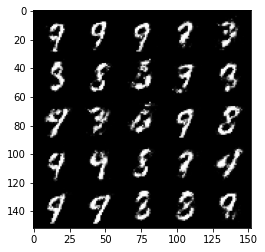

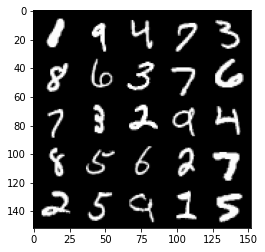

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.348595232486722, discriminator loss: 0.27230374434590304


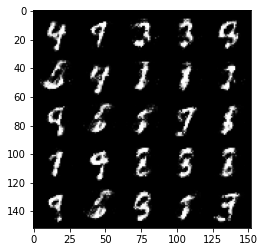

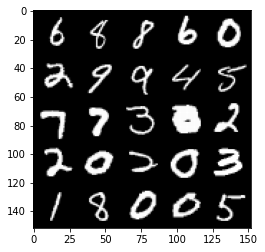

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.3074762306213397, discriminator loss: 0.28656554776430126


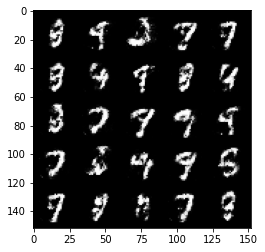

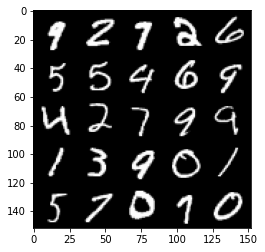

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.254950331211088, discriminator loss: 0.2966978830695154


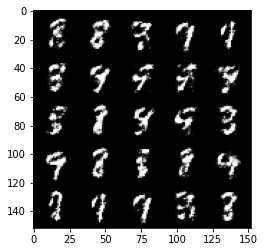

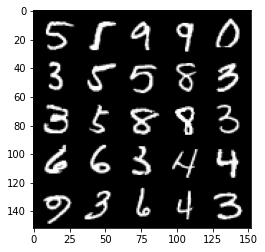

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.176311539173127, discriminator loss: 0.30211873218417207


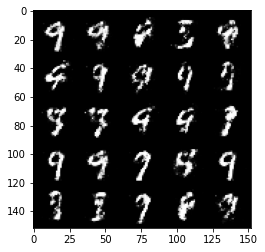

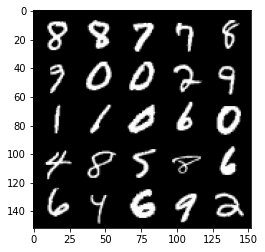

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.3007155847549416, discriminator loss: 0.29284805372357403


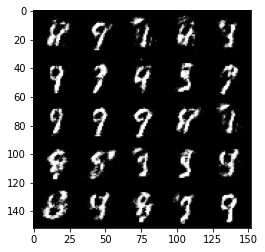

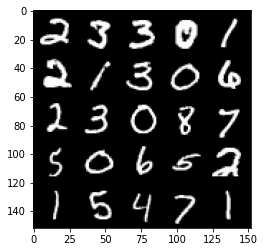

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.3477342038154596, discriminator loss: 0.27129765766859065


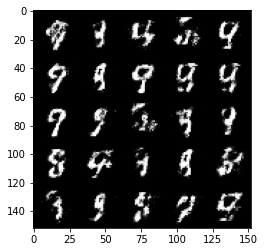

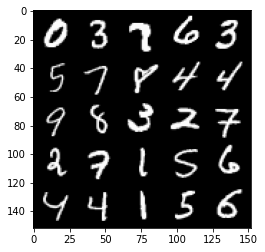

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.2463954000473025, discriminator loss: 0.29118239772319826


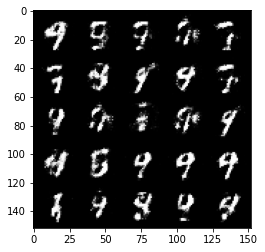

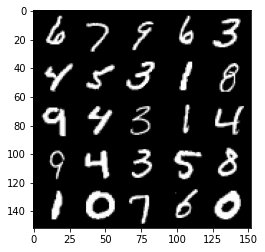

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.270806922197341, discriminator loss: 0.2942583193480971


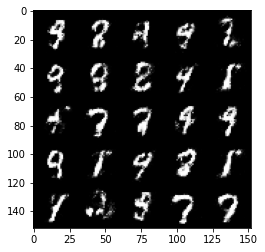

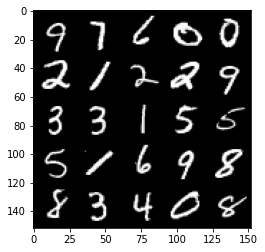

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.1717436230182656, discriminator loss: 0.30267849150299997


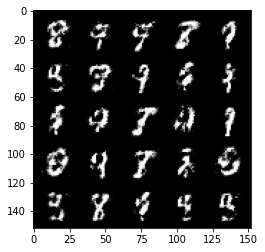

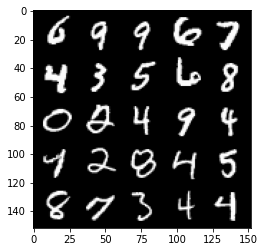

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.3533114995956415, discriminator loss: 0.25258535280823724


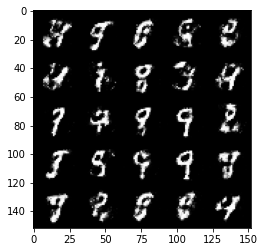

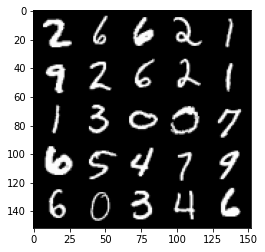

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.311589454650877, discriminator loss: 0.2802057109475133


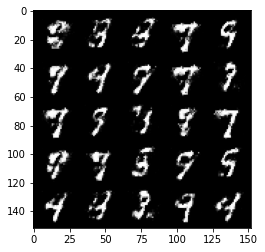

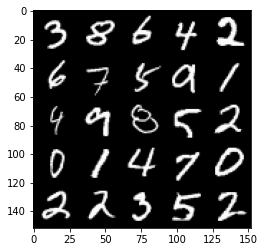

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.2992356526851654, discriminator loss: 0.28712857896089516


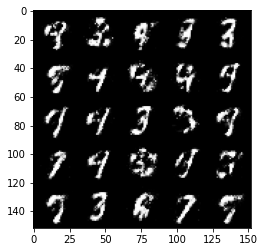

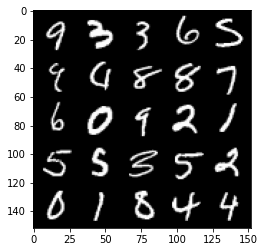

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.3015144543647765, discriminator loss: 0.2764163173139096


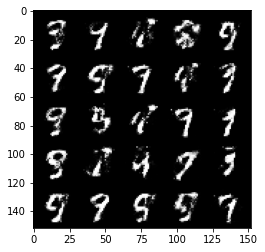

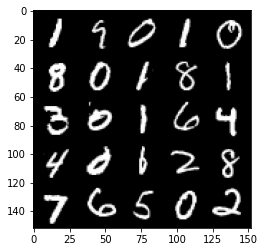

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.262428575277331, discriminator loss: 0.2770130670070648


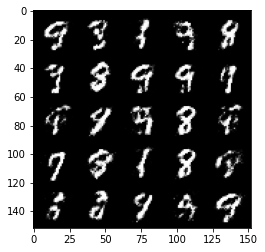

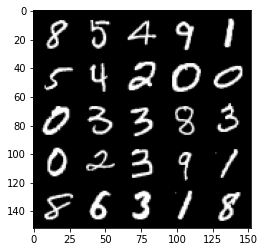

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.241275985240937, discriminator loss: 0.2897075515687467


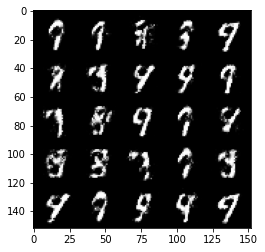

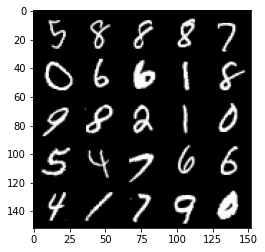

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.2154650559425377, discriminator loss: 0.2876280003786089


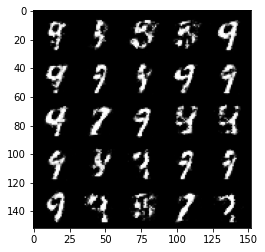

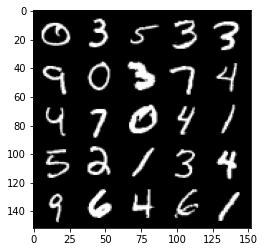

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.2025786845684054, discriminator loss: 0.29805772310495365


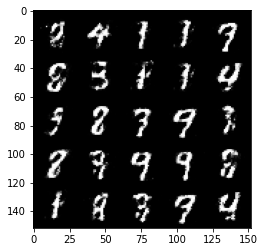

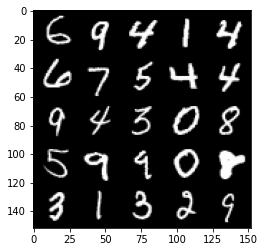

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.122035595178605, discriminator loss: 0.31370284721255276


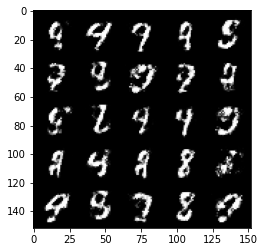

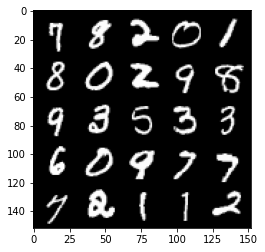

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.1840847709178917, discriminator loss: 0.2934581212401391


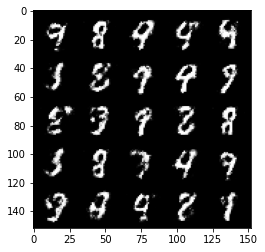

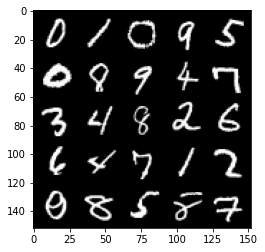

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.03949360895157, discriminator loss: 0.3246901541054248


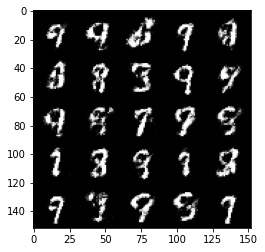

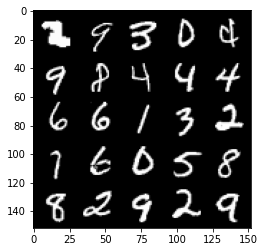

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.140348238229752, discriminator loss: 0.289688957720995


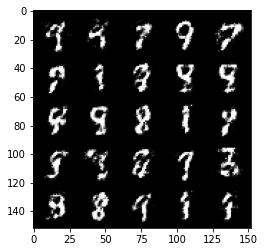

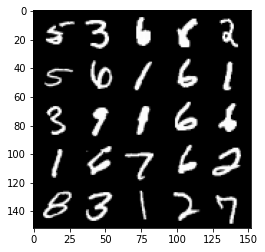

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.0710236363410943, discriminator loss: 0.31624165725708


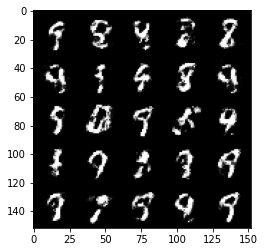

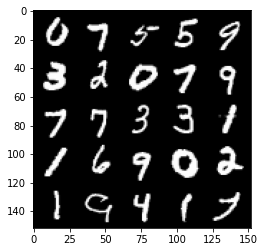

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.1238319132328023, discriminator loss: 0.2931604528427124


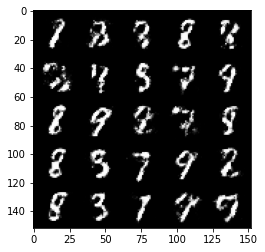

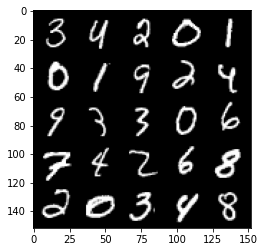

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.1309504234790784, discriminator loss: 0.30283462321758287


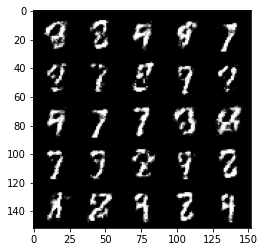

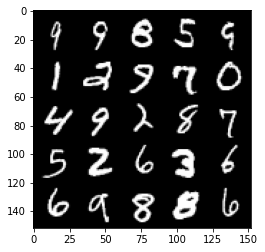

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.0548779497146605, discriminator loss: 0.30757764661312104


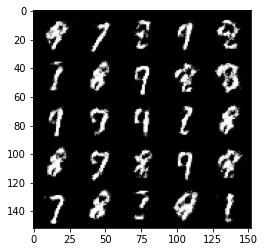

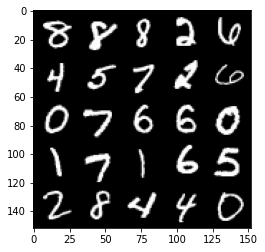

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.9719784481525409, discriminator loss: 0.3349477392137052


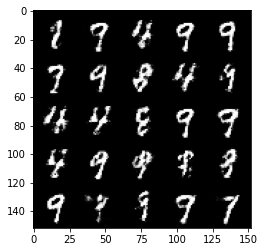

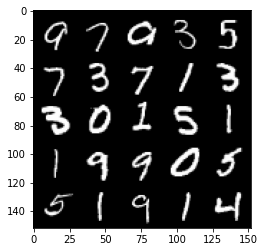

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.9958186025619502, discriminator loss: 0.32710486081242557


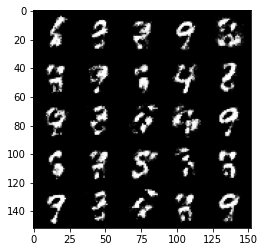

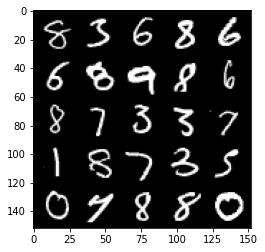

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 2.0525756380558007, discriminator loss: 0.3168818865120411


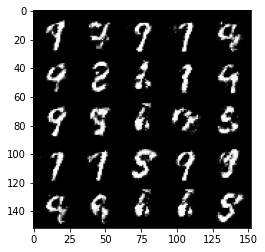

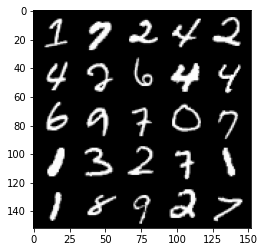

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 2.02008117246628, discriminator loss: 0.32202798461914045


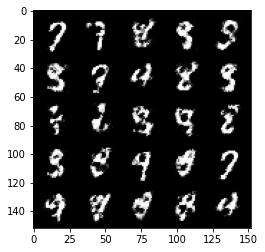

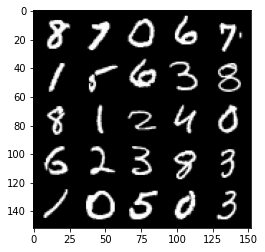

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.923798930883407, discriminator loss: 0.3363418255448343


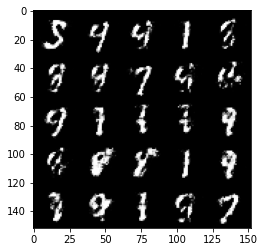

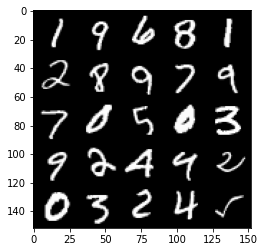

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.932281022548674, discriminator loss: 0.3342991990745069


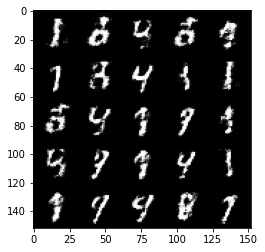

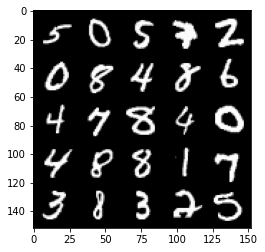

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.9806253550052633, discriminator loss: 0.3193445596694945


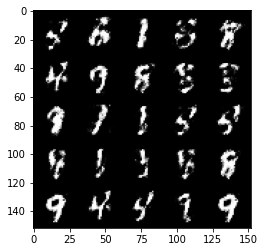

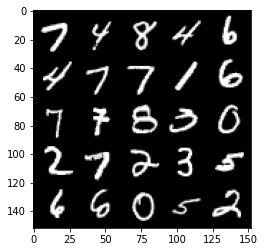

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.9821511676311476, discriminator loss: 0.3104173931479453


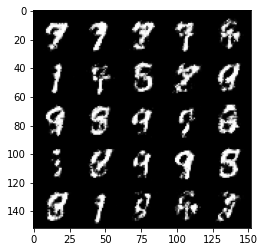

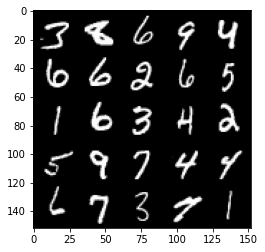

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 2.010812070608139, discriminator loss: 0.32966376781463597


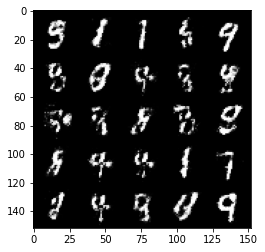

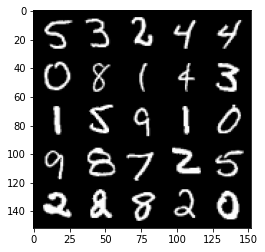

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.931402072906495, discriminator loss: 0.3362735355496404


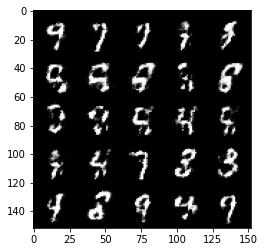

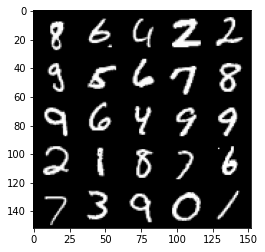

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.9077674970626821, discriminator loss: 0.33741994410753234


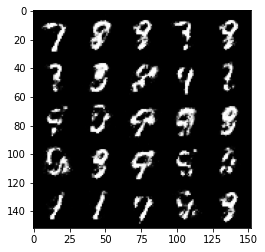

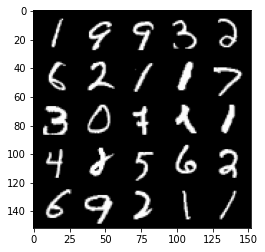

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.8931841375827791, discriminator loss: 0.34296235838532435


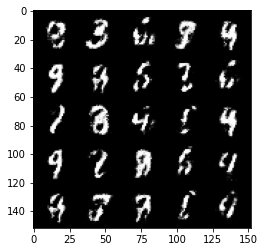

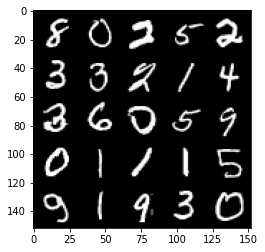

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.8207493386268623, discriminator loss: 0.36337679880857493


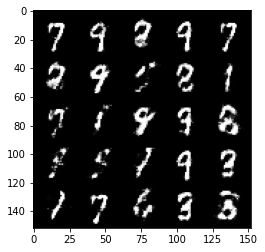

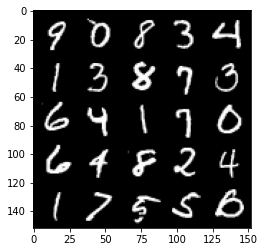

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.6847571399211896, discriminator loss: 0.38856520080566376


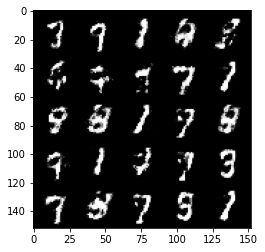

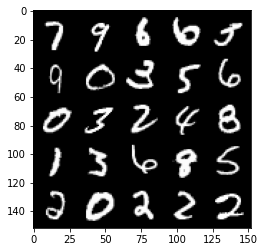

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.7895127782821683, discriminator loss: 0.3498343764543535


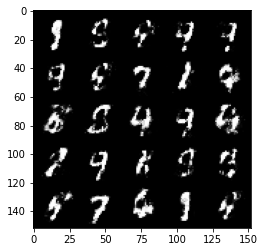

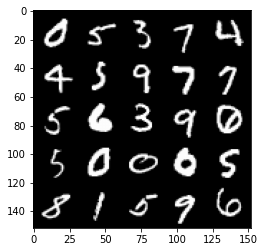

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.9196852669715876, discriminator loss: 0.32948465716838843


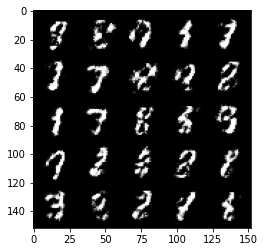

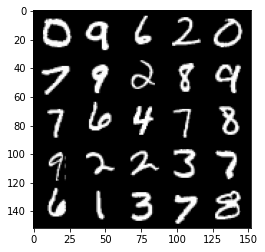

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.9488280580043797, discriminator loss: 0.32526871940493557


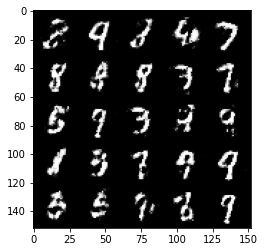

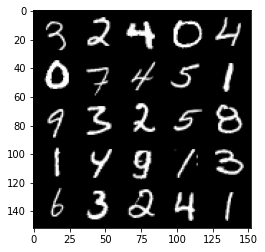

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.8242388546466828, discriminator loss: 0.3594600011706351


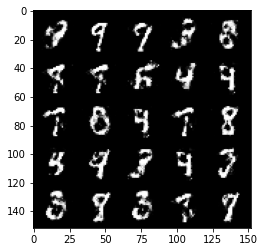

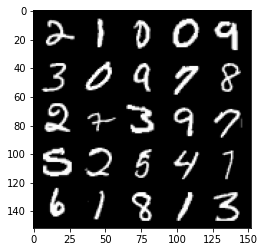

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.907254973649979, discriminator loss: 0.3313644422590732


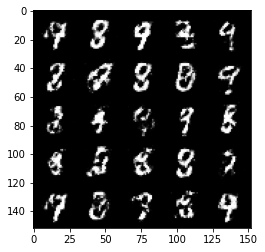

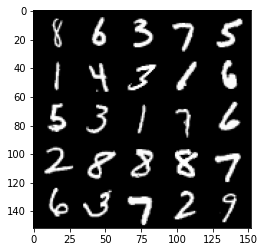

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.726222958564759, discriminator loss: 0.3851980026960375


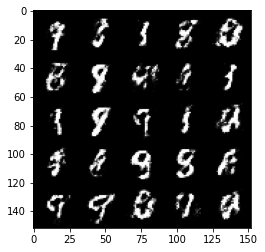

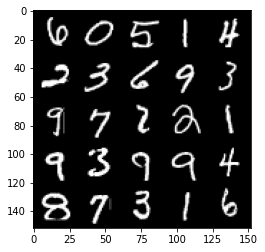

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.701014381408691, discriminator loss: 0.3838610208630566


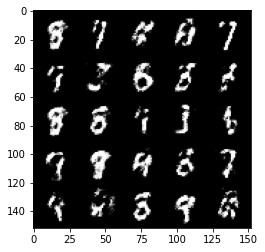

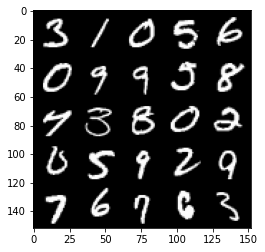

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.7583579511642469, discriminator loss: 0.3644060139358046


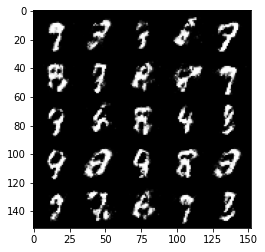

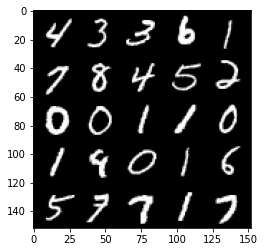

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.8369959390163417, discriminator loss: 0.35333795624971426


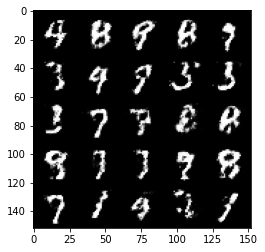

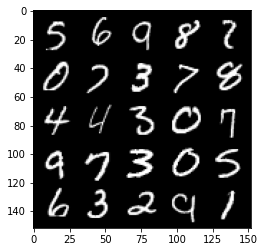

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.8023105368614212, discriminator loss: 0.36568181681632983


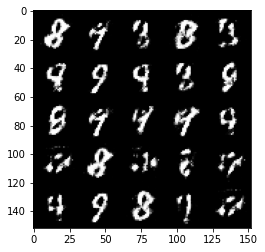

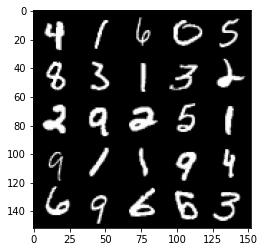

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.7528477387428263, discriminator loss: 0.38459903317689864


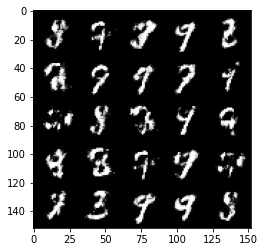

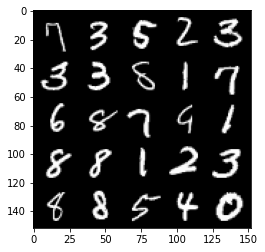

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.6847803421020529, discriminator loss: 0.3824229934215547


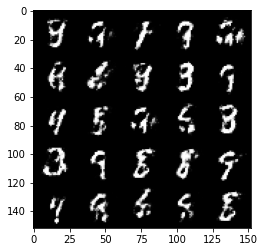

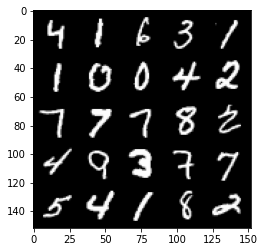

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.6962376148700697, discriminator loss: 0.3827737812399868


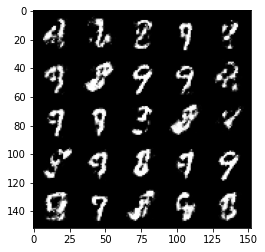

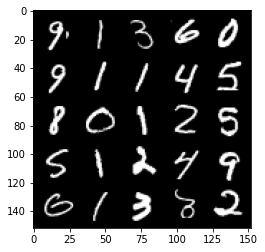

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.7232586438655855, discriminator loss: 0.36999541139602643


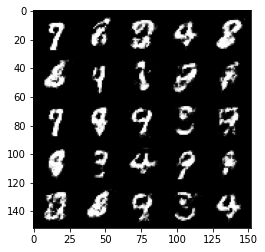

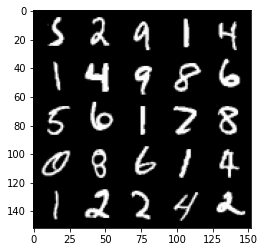

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.690078999042511, discriminator loss: 0.380685830950737


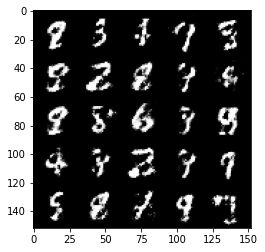

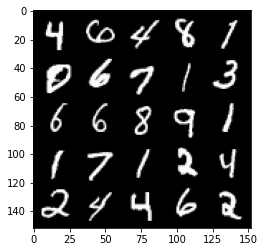

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.6625321879386898, discriminator loss: 0.386252612709999


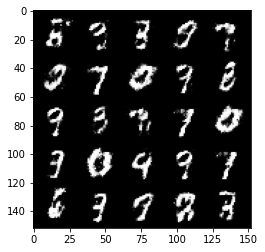

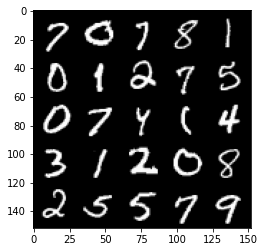

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.8084074316024776, discriminator loss: 0.3518949739336968


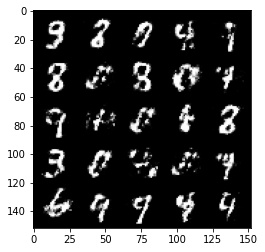

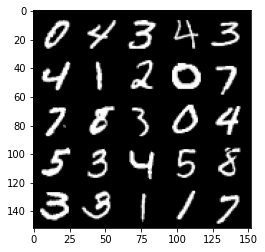

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.7652419729232784, discriminator loss: 0.36354673671722443


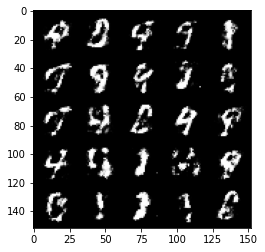

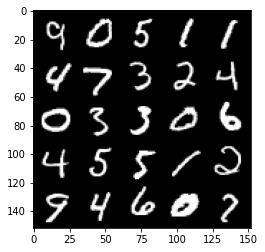

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.8426317124366767, discriminator loss: 0.34142746919393535


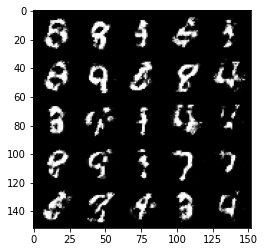

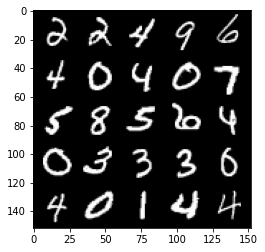

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.9652112579345695, discriminator loss: 0.3188533570468425


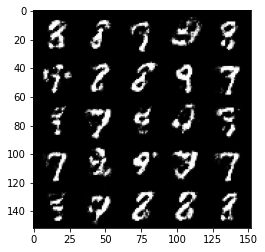

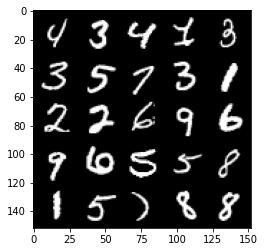

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.8492418289184585, discriminator loss: 0.3557876933813093


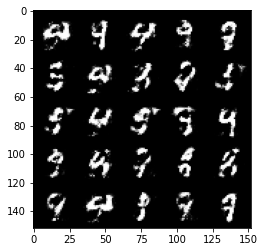

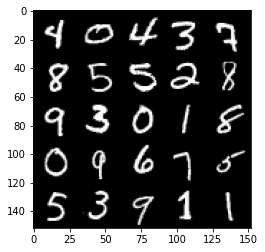

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.8907598569393138, discriminator loss: 0.3315690009295941


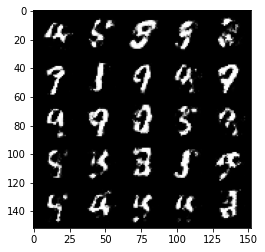

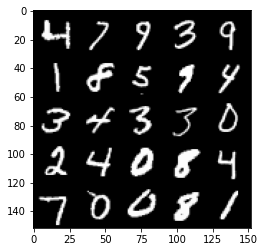

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.862236300706864, discriminator loss: 0.3379649032950401


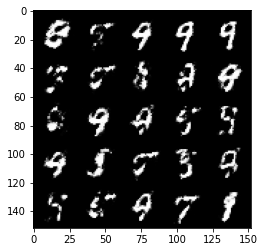

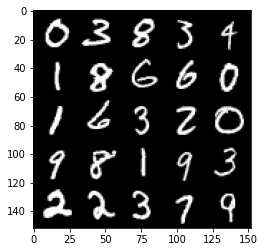

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.7952266840934745, discriminator loss: 0.35404125183820706


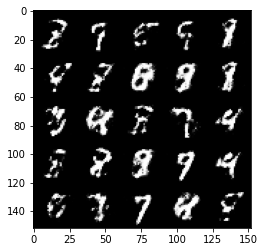

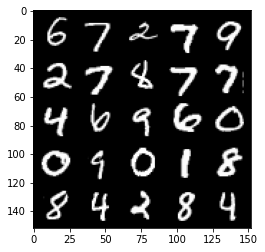

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.7381477766036992, discriminator loss: 0.35973875331878663


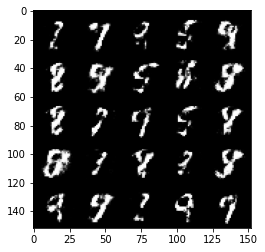

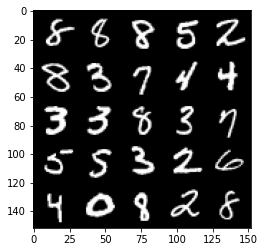

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.803127919912338, discriminator loss: 0.35751997154951065


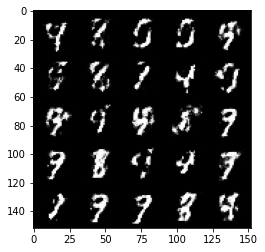

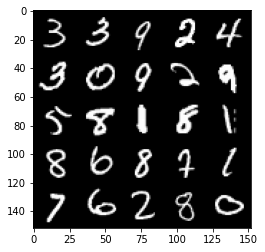

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.7792179889678965, discriminator loss: 0.34915855145454416


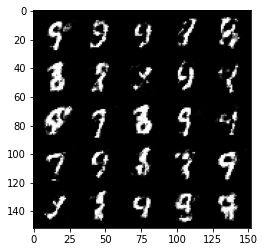

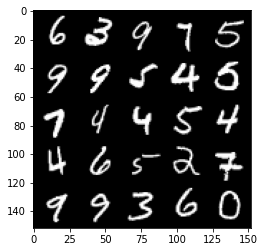

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.8361948382854474, discriminator loss: 0.33428708857297856


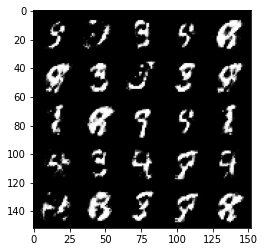

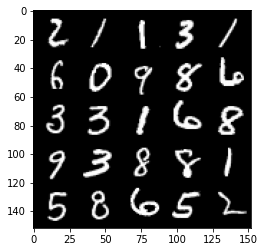

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.7724717321395873, discriminator loss: 0.35752985668182385


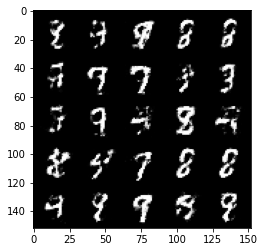

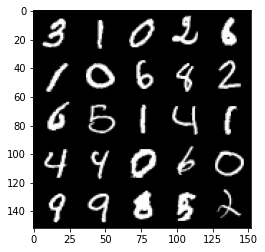

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.6369509520530698, discriminator loss: 0.39854658848047275


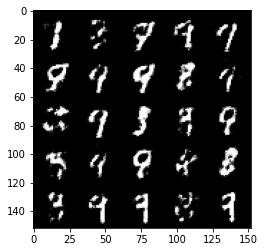

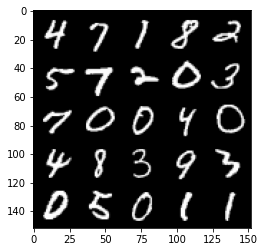

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.7568562092781033, discriminator loss: 0.35784087502956385


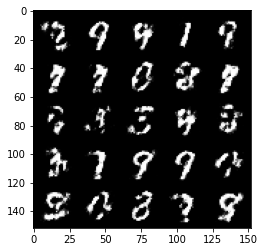

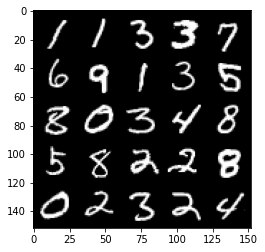

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.7260279543399806, discriminator loss: 0.3738849715590479


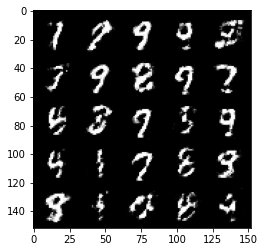

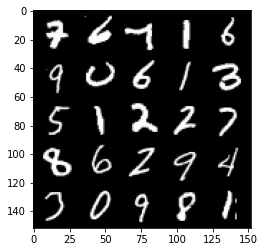

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.7093315680027001, discriminator loss: 0.37827436894178407


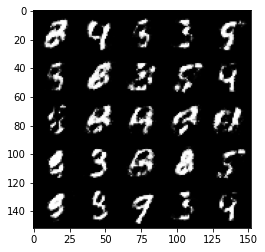

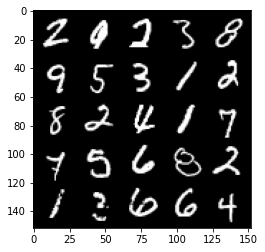

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.6278953521251684, discriminator loss: 0.3998728637099267


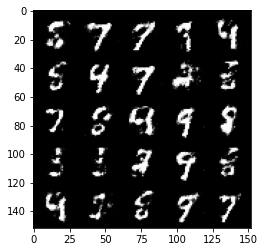

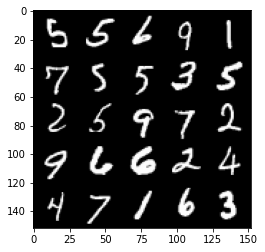

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.7393849802017196, discriminator loss: 0.3734157309234141


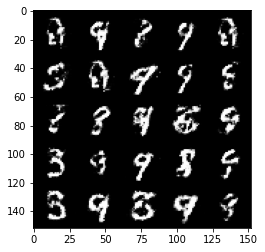

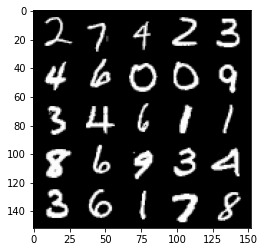

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.6456253759860986, discriminator loss: 0.39245773154497154


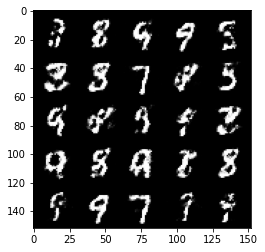

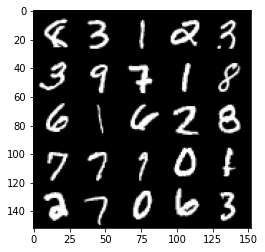

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.6573388094902046, discriminator loss: 0.3883055146336556


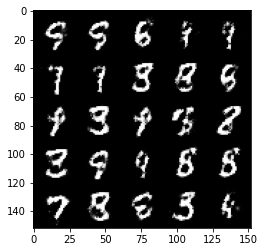

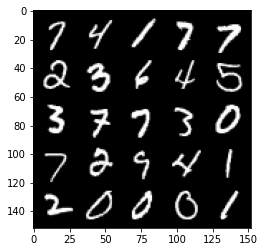

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.7026993236541754, discriminator loss: 0.3751013281941416


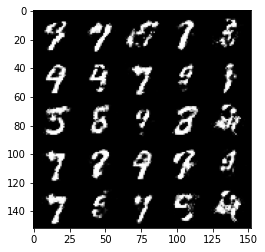

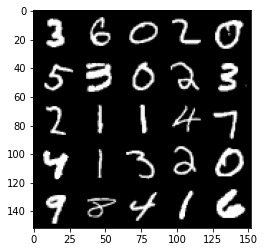

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.7044217512607556, discriminator loss: 0.37526777005195616


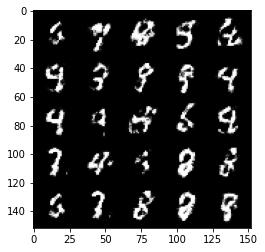

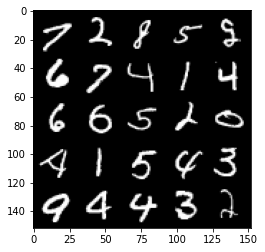

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.615223079919816, discriminator loss: 0.4012151589989659


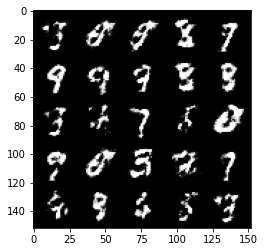

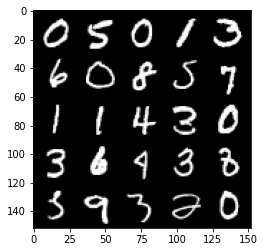

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.6321484382152571, discriminator loss: 0.38248003047704676


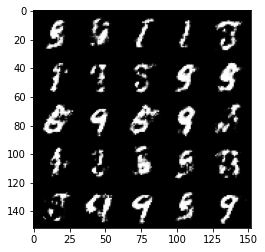

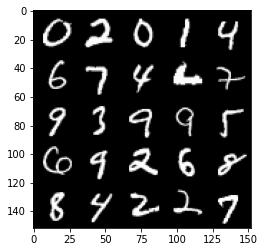

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.6428556802272796, discriminator loss: 0.3869421518445017


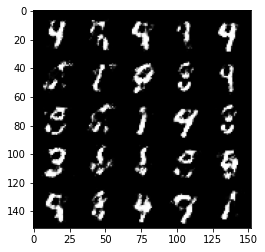

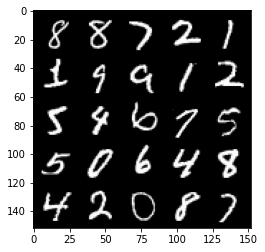

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.6744313008785245, discriminator loss: 0.3839210124611851


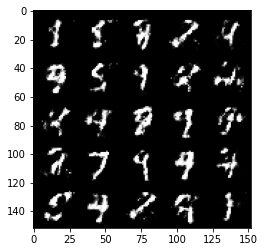

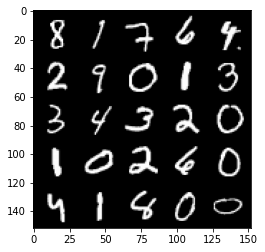

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.5535885655879977, discriminator loss: 0.409363915860653


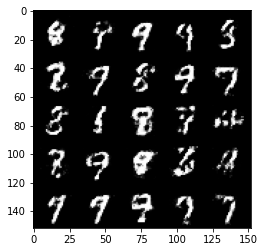

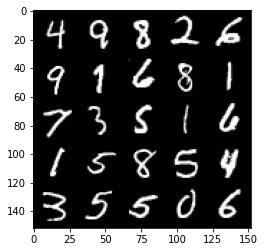

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.497201928138733, discriminator loss: 0.4226668609976768


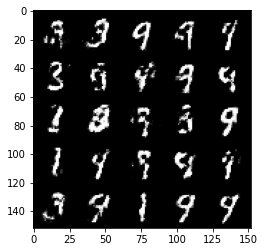

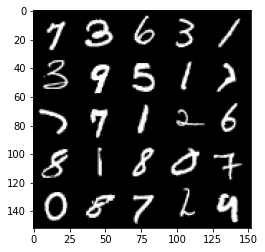

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.5477470357418066, discriminator loss: 0.41055632627010363


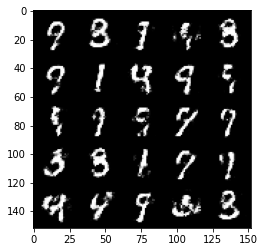

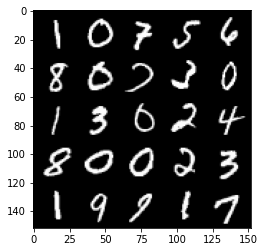

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.597401681900025, discriminator loss: 0.3976498948931693


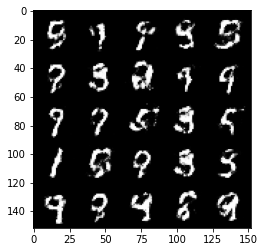

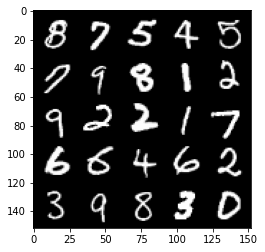

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.574573355197907, discriminator loss: 0.41139996165037146


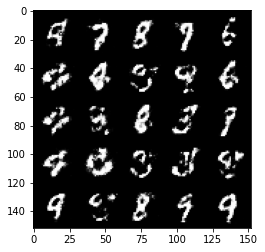

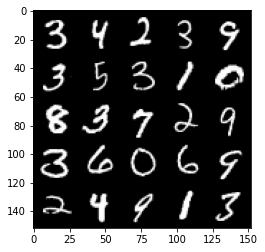

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.5331968944072725, discriminator loss: 0.41446598821878444


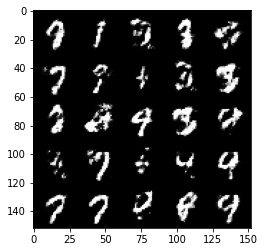

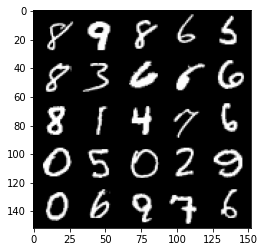

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.5166781203746795, discriminator loss: 0.4168856559395787


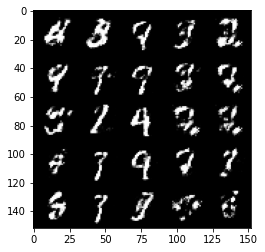

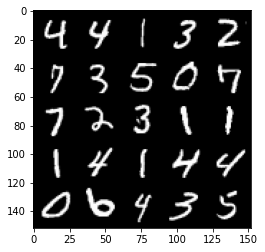

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.5878706948757162, discriminator loss: 0.39748078465461684


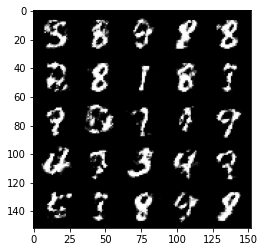

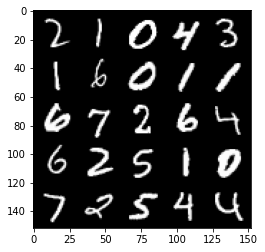

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.5559995293617253, discriminator loss: 0.41416024112701444


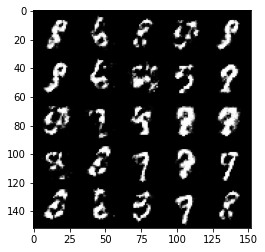

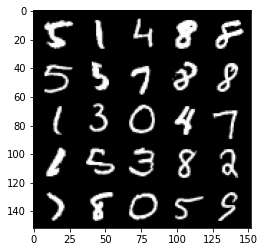

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.566685545682907, discriminator loss: 0.4084374113678929


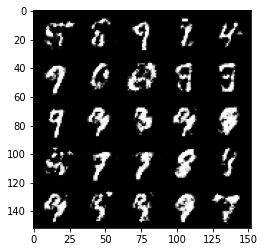

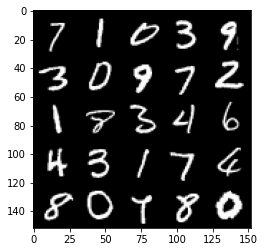

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.5009076659679388, discriminator loss: 0.43131570178270323


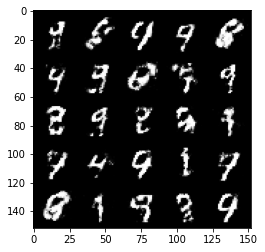

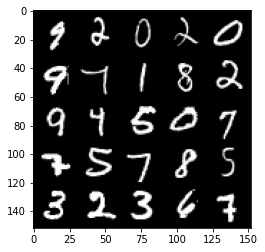

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.536680476665497, discriminator loss: 0.41985508793592463


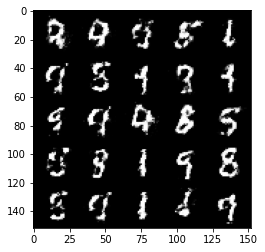

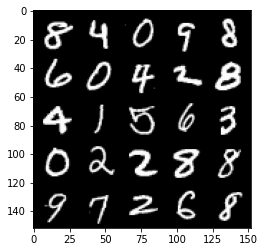

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.6589938893318172, discriminator loss: 0.3776956729292871


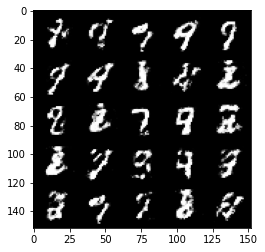

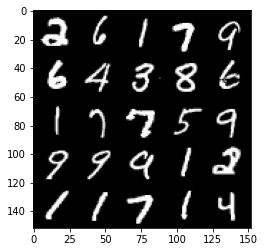

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.6027122702598569, discriminator loss: 0.39179505079984644


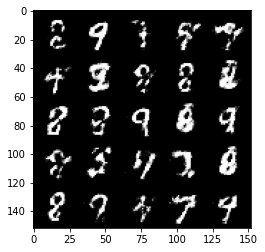

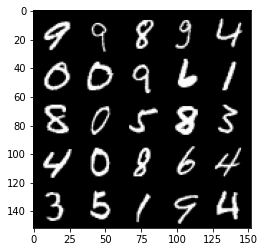

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.5599444503784174, discriminator loss: 0.40594545984268215


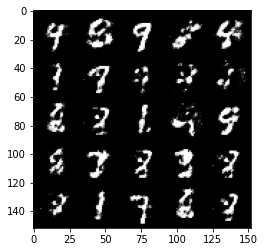

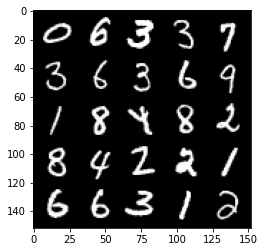

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.5344476227760315, discriminator loss: 0.41541059929132423


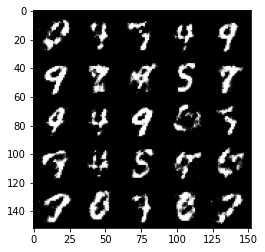

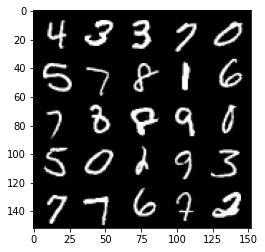

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.509276302814484, discriminator loss: 0.42124821543693525


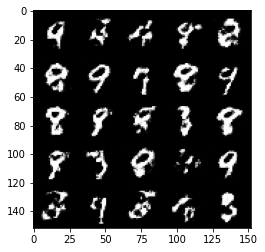

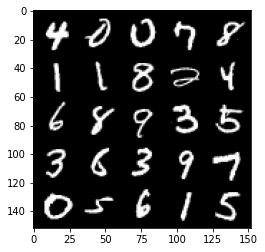

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.5101796250343333, discriminator loss: 0.41608236628770856


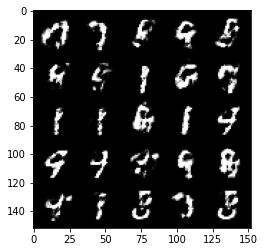

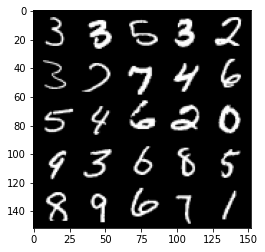

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.4825438132286073, discriminator loss: 0.4319036098122597


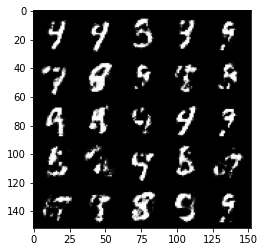

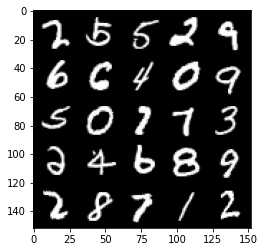

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.4932678198814398, discriminator loss: 0.4232291102409363


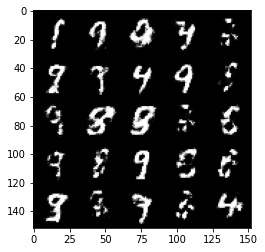

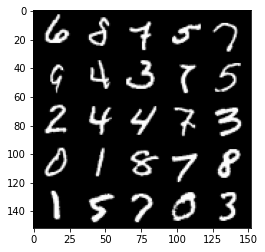

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.5116533153057095, discriminator loss: 0.4124947295784948


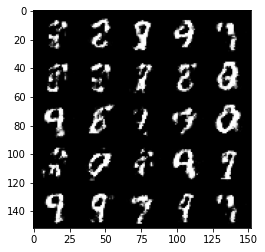

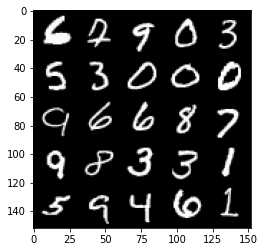

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.581794541358947, discriminator loss: 0.39774408334493633


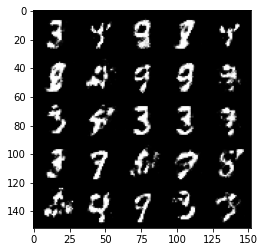

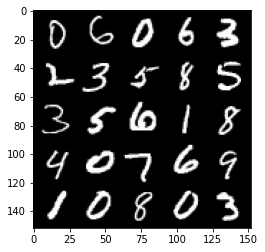

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.4861353547573086, discriminator loss: 0.41716395801305783


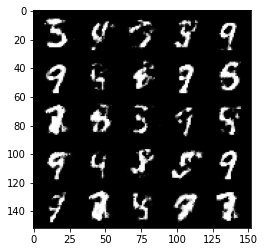

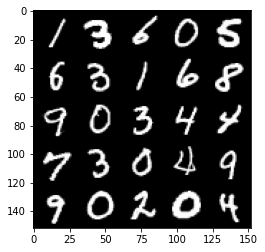

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.4742033998966217, discriminator loss: 0.4187957914471624


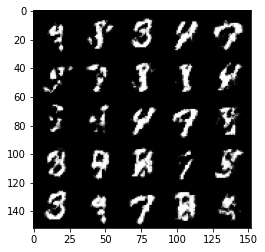

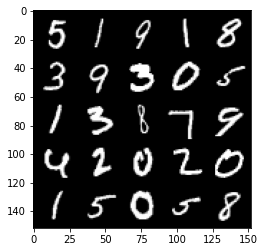

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.4772620179653178, discriminator loss: 0.4177458564043045


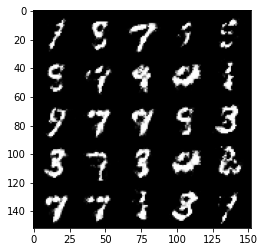

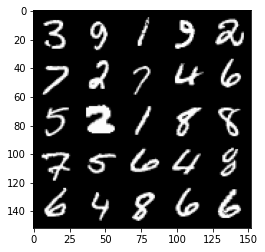

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.5304958524703984, discriminator loss: 0.41834466654062274


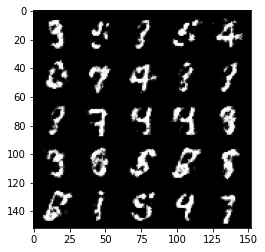

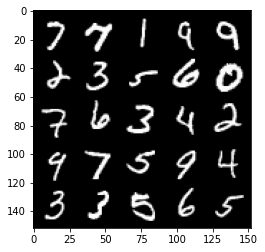

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.4642491507530198, discriminator loss: 0.4379275668859481


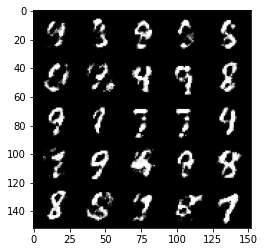

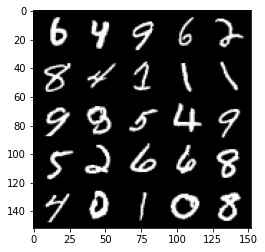

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.3996074168682096, discriminator loss: 0.4571136947870254


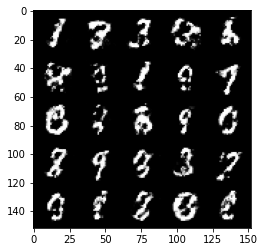

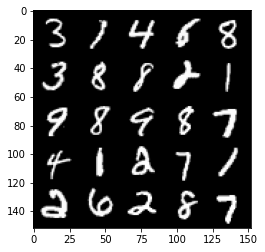

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.3865891170501699, discriminator loss: 0.4550780642628672


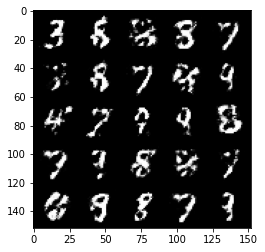

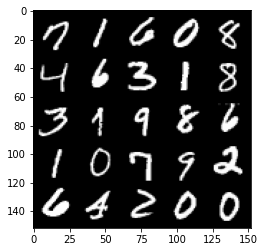

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.4648892180919646, discriminator loss: 0.4333007139563556


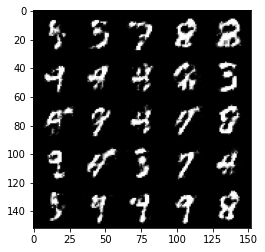

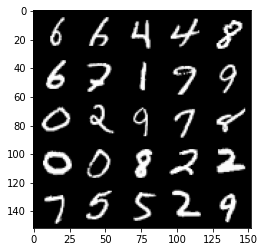

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.519209060430526, discriminator loss: 0.42891878598928435


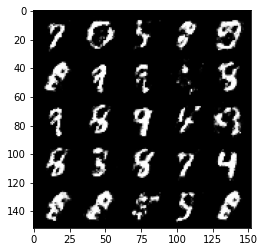

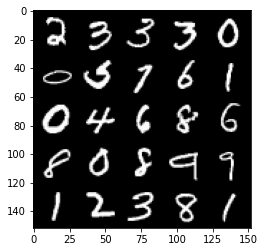

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.4543275513648997, discriminator loss: 0.43217799001932145


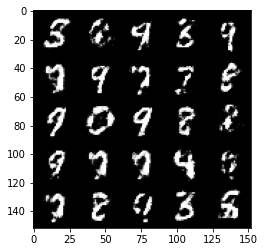

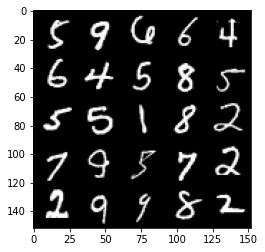

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.5045236301422125, discriminator loss: 0.42738779985904685


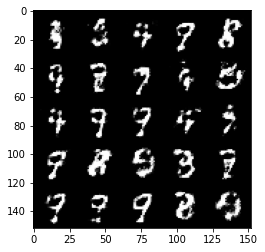

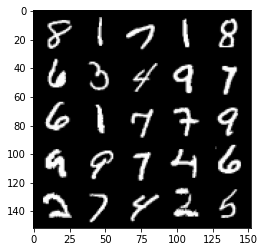

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.4755405330657982, discriminator loss: 0.4237577729821203


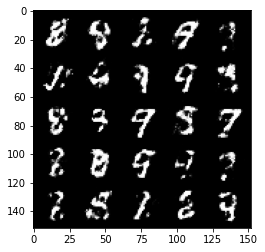

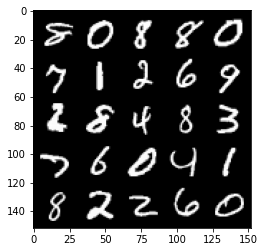

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.4418273277282714, discriminator loss: 0.4453424718379976


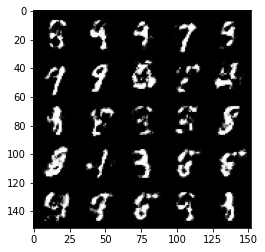

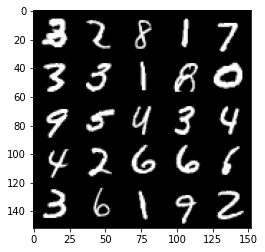

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 1.4305527958869926, discriminator loss: 0.43471719992160773


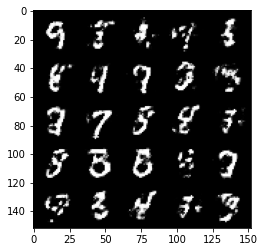

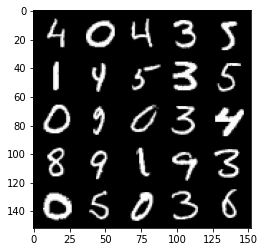

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.4725366983413706, discriminator loss: 0.4302031444907187


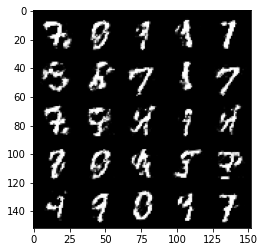

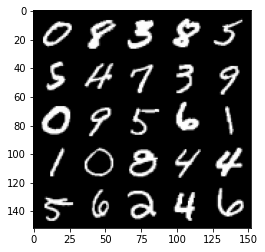

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.5098547949790952, discriminator loss: 0.4166606000661852


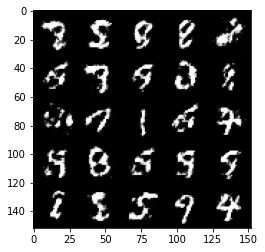

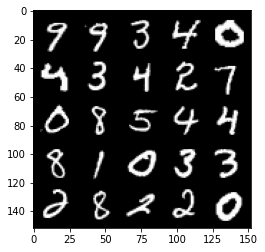

In [12]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Steps:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1